# Red Neuronal Convolucional (CNN) - Clasificador de Animales
### Clases: Ranas, Pájaros, Ballenas, Changos, Arañas

# 1. Importar Librerías

In [3]:
import numpy as np
import os
import re
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

import tensorflow as tf
import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.utils import to_categorical

print('TensorFlow version:', tf.__version__)
print('Keras version:', keras.__version__)

I0000 00:00:1779380297.650694    7957 port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
I0000 00:00:1779380297.651108    7957 cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
I0000 00:00:1779380298.178130    7957 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
I0000 00:00:1779380299.179469    7957 port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
I0000 00:0

TensorFlow version: 2.21.0
Keras version: 3.14.1


# 2. Cargar Imágenes del Dataset

In [4]:
# Ruta a la carpeta principal del dataset
dirname = '/home/glowar23/Descargas/dataset_bueno'
imgpath = dirname + os.sep

images = []
labels = []

# Nombres de las clases (deben coincidir EXACTAMENTE con los nombres de las carpetas)
clases_nombres = ['ranas', 'pajaros', 'ballenas', 'changos', 'aranas']

print("Leyendo imágenes de:", imgpath)
print("-" * 50)

dircount = []  # guardará cuántas imágenes tiene cada clase

for idx, clase in enumerate(clases_nombres):
    folder = os.path.join(imgpath, clase)
    
    if not os.path.exists(folder):
        print(f"⚠️  ALERTA: No se encontró la carpeta '{clase}' en {folder}")
        continue
    
    contador = 0
    for filename in os.listdir(folder):
        if re.search(r"\.(jpg|jpeg|png|bmp|webp)$", filename, re.IGNORECASE):
            filepath = os.path.join(folder, filename)
            image = cv2.imread(filepath, cv2.IMREAD_COLOR)
            if image is not None:
                # Nos aseguramos que todas sean 35x35
                image = cv2.resize(image, (128, 128))
                images.append(image)
                labels.append(idx)
                contador += 1
    
    dircount.append(contador)
    print(f"Clase {idx} - {clase}: {contador} imágenes cargadas")

print("-" * 50)
print(f'✅ Total de imágenes cargadas: {len(images)}')

Leyendo imágenes de: /home/glowar23/Descargas/dataset_bueno/
--------------------------------------------------


libpng warning: eXIf: duplicate
libpng warning: eXIf: duplicate


Clase 0 - ranas: 8120 imágenes cargadas
Clase 1 - pajaros: 8126 imágenes cargadas
Clase 2 - ballenas: 8114 imágenes cargadas
Clase 3 - changos: 8173 imágenes cargadas
Clase 4 - aranas: 8275 imágenes cargadas
--------------------------------------------------
✅ Total de imágenes cargadas: 40808


# 3. Verificar Equilibrio del Dataset

=== EQUILIBRIO DEL DATASET ===
----------------------------------------
Clase 0 | ranas      |   8120 imágenes | ████████████████
Clase 1 | pajaros    |   8126 imágenes | ████████████████
Clase 2 | ballenas   |   8114 imágenes | ████████████████
Clase 3 | changos    |   8173 imágenes | ████████████████
Clase 4 | aranas     |   8275 imágenes | ████████████████
----------------------------------------
Total: 40808 imágenes
⚠️  Dataset DESBALANCEADO (mín: 8114, máx: 8275)


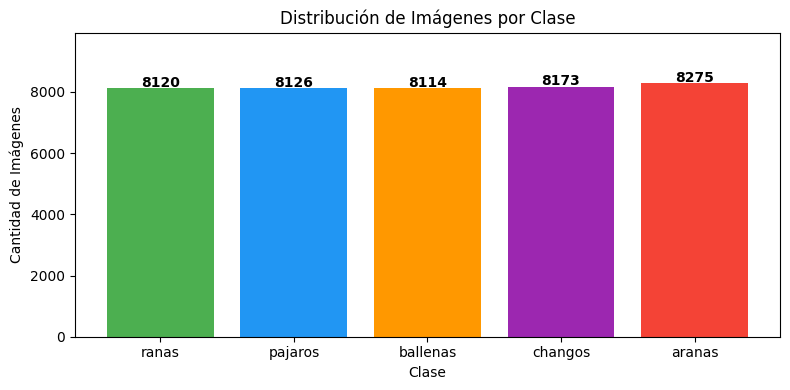

In [25]:
print("=== EQUILIBRIO DEL DATASET ===")
print("-" * 40)
for i, (clase, cantidad) in enumerate(zip(clases_nombres, dircount)):
    barra = '█' * (cantidad // 500)
    print(f"Clase {i} | {clase:<10} | {cantidad:>6} imágenes | {barra}")

print("-" * 40)
total = sum(dircount)
print(f"Total: {total} imágenes")

# Verificar si está balanceado
min_clase = min(dircount)
max_clase = max(dircount)
if max_clase - min_clase <= 100:
    print("✅ Dataset BALANCEADO (diferencia <= 100 imágenes entre clases)")
else:
    print(f"⚠️  Dataset DESBALANCEADO (mín: {min_clase}, máx: {max_clase})")

# Gráfica de equilibrio
plt.figure(figsize=(8, 4))
plt.bar(clases_nombres, dircount, color=['#4CAF50','#2196F3','#FF9800','#9C27B0','#F44336'])
plt.title('Distribución de Imágenes por Clase')
plt.xlabel('Clase')
plt.ylabel('Cantidad de Imágenes')
plt.ylim(0, max(dircount) * 1.2)
for i, v in enumerate(dircount):
    plt.text(i, v + 50, str(v), ha='center', fontweight='bold')
plt.tight_layout()
plt.show()

# 4. Convertir a Matrices Numpy

In [26]:
y = np.array(labels)
X = np.array(images, dtype=np.uint8)

# Reshape: (N, 35, 35) -> (N, 35, 35, 1)  [1 = escala de grises]
X = X.reshape(X.shape[0], 128, 128, 3)

classes = np.unique(y)
nClasses = len(classes)

print(f'Forma de X (imágenes): {X.shape}')
print(f'Forma de y (etiquetas): {y.shape}')
print(f'Número de clases: {nClasses}')
print(f'Clases: {list(zip(classes, clases_nombres))}')

Forma de X (imágenes): (40808, 128, 128, 3)
Forma de y (etiquetas): (40808,)
Número de clases: 5
Clases: [(np.int64(0), 'ranas'), (np.int64(1), 'pajaros'), (np.int64(2), 'ballenas'), (np.int64(3), 'changos'), (np.int64(4), 'aranas')]


# 5. Dividir en Sets de Entrenamiento y Prueba

In [27]:
# 80% entrenamiento, 20% prueba
train_X, test_X, train_Y, test_Y = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

print(f'Set de Entrenamiento: {train_X.shape}  |  Etiquetas: {train_Y.shape}')
print(f'Set de Prueba:        {test_X.shape}   |  Etiquetas: {test_Y.shape}')

Set de Entrenamiento: (32646, 128, 128, 3)  |  Etiquetas: (32646,)
Set de Prueba:        (8162, 128, 128, 3)   |  Etiquetas: (8162,)


# 6. Visualizar Ejemplos del Dataset

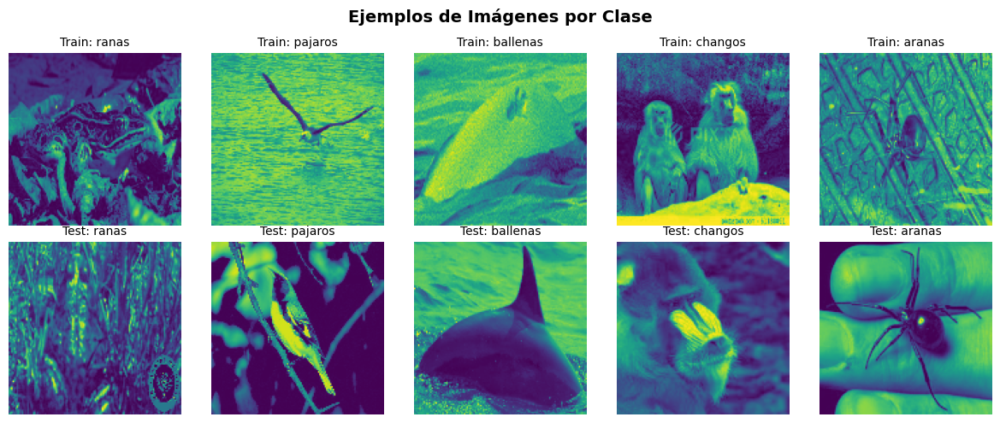

In [28]:
fig, axes = plt.subplots(2, 5, figsize=(12, 5))
fig.suptitle('Ejemplos de Imágenes por Clase', fontsize=14, fontweight='bold')

for clase_idx in range(nClasses):
    idx = np.where(train_Y == clase_idx)[0][0]
    
    axes[0, clase_idx].imshow(train_X[idx, :, :, 0])
    axes[0, clase_idx].set_title(f'Train: {clases_nombres[clase_idx]}', fontsize=10)
    axes[0, clase_idx].axis('off')
    
    idx2 = np.where(test_Y == clase_idx)[0][0]
    axes[1, clase_idx].imshow(test_X[idx2, :, :, 0])
    axes[1, clase_idx].set_title(f'Test: {clases_nombres[clase_idx]}', fontsize=10)
    axes[1, clase_idx].axis('off')

plt.tight_layout()
plt.show()

# 7. Preprocesar las Imágenes (Normalización)

In [29]:
# Convertir a float y normalizar entre 0 y 1
train_X = train_X.astype('float32') / 255.0
test_X  = test_X.astype('float32')  / 255.0

print(f'Rango de valores - Mín: {train_X.min():.2f}, Máx: {train_X.max():.2f}')
print('✅ Imágenes normalizadas correctamente')

Rango de valores - Mín: 0.00, Máx: 1.00
✅ Imágenes normalizadas correctamente


# 8. One-Hot Encoding de Etiquetas

In [30]:
train_Y_one_hot = to_categorical(train_Y, num_classes=nClasses)
test_Y_one_hot  = to_categorical(test_Y,  num_classes=nClasses)

print('Etiqueta original (train_Y[0]):', train_Y[0], '->', clases_nombres[train_Y[0]])
print('One-hot encoding:', train_Y_one_hot[0])

Etiqueta original (train_Y[0]): 2 -> ballenas
One-hot encoding: [0. 0. 1. 0. 0.]


# 9. Crear Set de Validación

In [31]:
# Dividir el set de entrenamiento en entrenamiento (80%) y validación (20%)
train_X, valid_X, train_label, valid_label = train_test_split(
    train_X, train_Y_one_hot, test_size=0.2, random_state=48
)

print(f'Entrenamiento: {train_X.shape}  |  Labels: {train_label.shape}')
print(f'Validación:    {valid_X.shape}   |  Labels: {valid_label.shape}')
print(f'Prueba:        {test_X.shape}    |  Labels: {test_Y_one_hot.shape}')

Entrenamiento: (26116, 128, 128, 3)  |  Labels: (26116, 5)
Validación:    (6530, 128, 128, 3)   |  Labels: (6530, 5)
Prueba:        (8162, 128, 128, 3)    |  Labels: (8162, 5)


# 10. Crear el Modelo CNN

**Arquitectura:** 2 capas convolucionales + capas densas para clasificación

In [32]:
# Parámetros de entrenamiento
INIT_LR    = 1e-3   # Learning rate inicial
epochs     = 35    # 40 épocas para mejor precisión
batch_size = 64     # Imágenes por lote

In [33]:
# =============================================
#   ARQUITECTURA CNN - 2 CAPAS CONVOLUCIONALES
# =============================================
sport_model = Sequential(name='CNN_Animales')

# --- CAPA CONVOLUCIONAL 1 ---
sport_model.add(Conv2D(32, kernel_size=(3, 3), activation='linear',
                       padding='same', input_shape=(128, 128, 3)))
sport_model.add(LeakyReLU(alpha=0.1))
sport_model.add(MaxPooling2D((2, 2), padding='same'))
sport_model.add(Dropout(0.3))

# --- CAPA CONVOLUCIONAL 2 ---
sport_model.add(Conv2D(64, kernel_size=(3, 3), activation='linear', padding='same'))
sport_model.add(LeakyReLU(alpha=0.1))
sport_model.add(MaxPooling2D((2, 2), padding='same'))
sport_model.add(Dropout(0.3))

# --- CAPAS DENSAS (Clasificación final) ---
sport_model.add(Flatten())
sport_model.add(Dense(128, activation='linear'))
sport_model.add(LeakyReLU(alpha=0.1))
sport_model.add(Dropout(0.5))
sport_model.add(Dense(nClasses, activation='softmax'))

sport_model.summary()

/home/glowar23/Descargas/venv/lib/python3.13/site-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/home/glowar23/Descargas/venv/lib/python3.13/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "CNN_Animales"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)               │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 65536)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │     8,388,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_5 (LeakyReLU)       │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,408,773 (32.08 MB)

 Trainable params: 8,408,773 (32.08 MB)

 Non-trainable params: 0 (0.00 B)

# 11. Compilar el Modelo

In [34]:
sport_model.compile(
    loss=keras.losses.categorical_crossentropy,
    optimizer=tf.keras.optimizers.Adam(learning_rate=INIT_LR),
    metrics=['accuracy']
)
print('✅ Modelo compilado correctamente')

✅ Modelo compilado correctamente


# 12. Entrenar el Modelo

In [35]:
sport_train = sport_model.fit(
    train_X, train_label,
    batch_size=batch_size,
    epochs=epochs,
    verbose=1,
    validation_data=(valid_X, valid_label)
)

Epoch 1/35


E0000 00:00:1779337994.640952    8026 meta_optimizer.cc:967] remapper failed: INVALID_ARGUMENT: Mutation::Apply error: fanout 'StatefulPartitionedCall/gradient_tape/CNN_Animales_1/leaky_re_lu_4_1/LeakyRelu/LeakyReluGrad' exist for missing node 'StatefulPartitionedCall/CNN_Animales_1/conv2d_3_1/BiasAdd'.


409/409 ━━━━━━━━━━━━━━━━━━━━ 89s 212ms/step - accuracy: 0.5714 - loss: 1.1355 - val_accuracy: 0.6314 - val_loss: 1.0520
Epoch 2/35
409/409 ━━━━━━━━━━━━━━━━━━━━ 85s 209ms/step - accuracy: 0.7323 - loss: 0.7203 - val_accuracy: 0.7429 - val_loss: 0.7076
Epoch 3/35
409/409 ━━━━━━━━━━━━━━━━━━━━ 87s 213ms/step - accuracy: 0.7827 - loss: 0.5871 - val_accuracy: 0.7675 - val_loss: 0.6731
Epoch 4/35
409/409 ━━━━━━━━━━━━━━━━━━━━ 88s 214ms/step - accuracy: 0.8222 - loss: 0.4847 - val_accuracy: 0.8260 - val_loss: 0.5101
Epoch 5/35
409/409 ━━━━━━━━━━━━━━━━━━━━ 88s 216ms/step - accuracy: 0.8536 - loss: 0.3967 - val_accuracy: 0.7968 - val_loss: 0.6687
Epoch 6/35
409/409 ━━━━━━━━━━━━━━━━━━━━ 88s 216ms/step - accuracy: 0.8816 - loss: 0.3252 - val_accuracy: 0.7603 - val_loss: 0.8244
Epoch 7/35
409/409 ━━━━━━━━━━━━━━━━━━━━ 90s 221ms/step - accuracy: 0.8993 - loss: 0.2840 - val_accuracy: 0.8369 - val_loss: 0.5557
Epoch 8/35
409/409 ━━━━━━━━━━━━━━━━━━━━ 93s 226ms/step - accuracy: 0.9184 - loss: 0.2307 - val

# 13. Guardar el Modelo Entrenado

In [36]:
sport_model.save("modelo_cnn128.h5")
print("✅ Modelo guardado como: modelo_cnn128.h5")

✅ Modelo guardado como: modelo_cnn128.h5


# 14. Evaluar el Modelo

In [37]:
test_eval = sport_model.evaluate(test_X, test_Y_one_hot, verbose=1)
print(f'\nPérdida (Loss):   {test_eval[0]:.4f}')
print(f'Precisión (Acc):  {test_eval[1]*100:.2f}%')

256/256 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - accuracy: 0.8467 - loss: 0.8275

Pérdida (Loss):   0.8275
Precisión (Acc):  84.67%


# 15. Gráficas de Entrenamiento

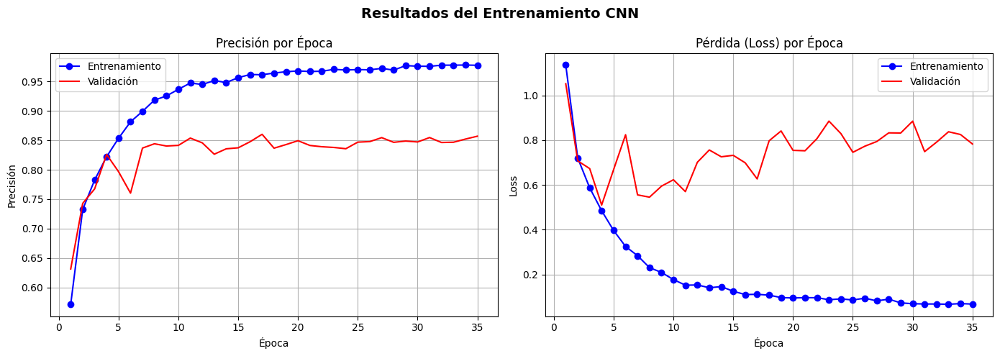

In [38]:
accuracy     = sport_train.history['accuracy']
val_accuracy = sport_train.history['val_accuracy']
loss         = sport_train.history['loss']
val_loss     = sport_train.history['val_loss']
epocas_rango = range(1, len(accuracy) + 1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.plot(epocas_rango, accuracy,     'bo-', label='Entrenamiento')
ax1.plot(epocas_rango, val_accuracy, 'r-',  label='Validación')
ax1.set_title('Precisión por Época')
ax1.set_xlabel('Época')
ax1.set_ylabel('Precisión')
ax1.legend()
ax1.grid(True)

ax2.plot(epocas_rango, loss,     'bo-', label='Entrenamiento')
ax2.plot(epocas_rango, val_loss, 'r-',  label='Validación')
ax2.set_title('Pérdida (Loss) por Época')
ax2.set_xlabel('Época')
ax2.set_ylabel('Loss')
ax2.legend()
ax2.grid(True)

plt.suptitle('Resultados del Entrenamiento CNN', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# 16. Reporte de Clasificación

In [39]:
predicted_probs   = sport_model.predict(test_X)
predicted_classes = np.argmax(predicted_probs, axis=1)

print("=== REPORTE DE CLASIFICACIÓN ===")
print(classification_report(test_Y, predicted_classes, target_names=clases_nombres))

256/256 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step
=== REPORTE DE CLASIFICACIÓN ===
              precision    recall  f1-score   support

       ranas       0.89      0.86      0.88      1624
     pajaros       0.85      0.69      0.76      1625
    ballenas       0.91      0.95      0.93      1623
     changos       0.86      0.88      0.87      1635
      aranas       0.74      0.85      0.79      1655

    accuracy                           0.85      8162
   macro avg       0.85      0.85      0.85      8162
weighted avg       0.85      0.85      0.85      8162



# 17. Ver Aciertos y Errores

Correctas:   6911
Incorrectas: 1251


/tmp/ipykernel_8026/3493664789.py:14: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/glowar23/Descargas/venv/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


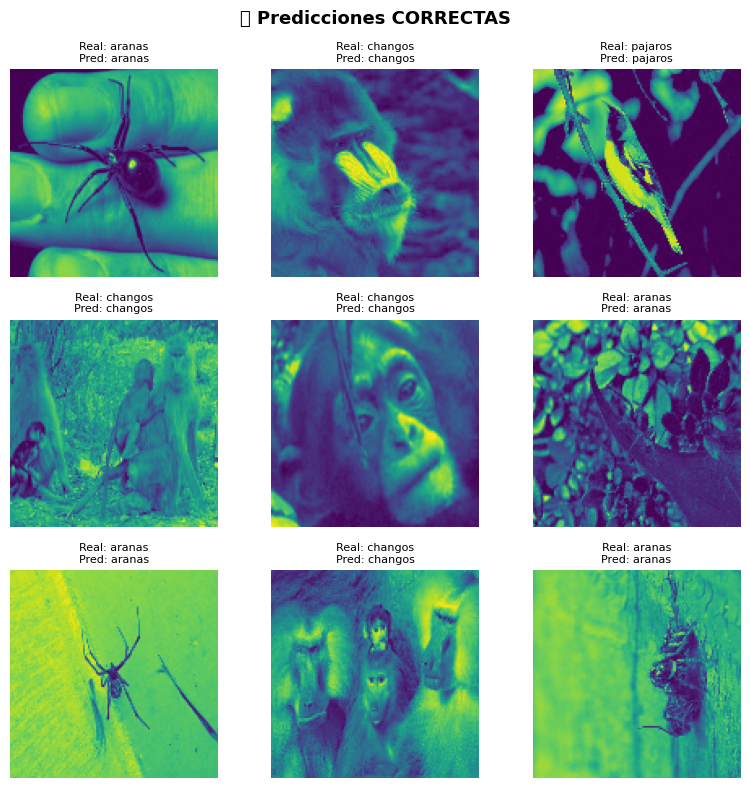

/tmp/ipykernel_8026/3493664789.py:26: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/glowar23/Descargas/venv/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


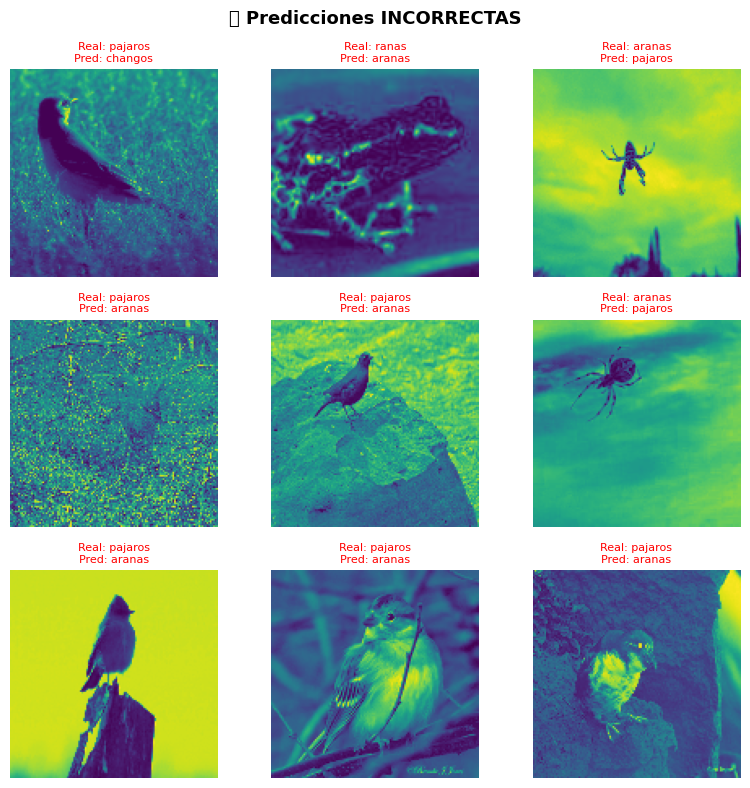

In [40]:
correct   = np.where(predicted_classes == test_Y)[0]
incorrect = np.where(predicted_classes != test_Y)[0]
print(f'Correctas:   {len(correct)}')
print(f'Incorrectas: {len(incorrect)}')

# Mostrar 9 aciertos
fig, axes = plt.subplots(3, 3, figsize=(8, 8))
fig.suptitle('✅ Predicciones CORRECTAS', fontsize=13, fontweight='bold')
for i, idx in enumerate(correct[:9]):
    ax = axes[i // 3, i % 3]
    ax.imshow(test_X[idx, :, :, 0])
    ax.set_title(f'Real: {clases_nombres[test_Y[idx]]}\nPred: {clases_nombres[predicted_classes[idx]]}', fontsize=8)
    ax.axis('off')
plt.tight_layout()
plt.show()

# Mostrar 9 errores
if len(incorrect) > 0:
    fig, axes = plt.subplots(3, 3, figsize=(8, 8))
    fig.suptitle('❌ Predicciones INCORRECTAS', fontsize=13, fontweight='bold')
    for i, idx in enumerate(incorrect[:9]):
        ax = axes[i // 3, i % 3]
        ax.imshow(test_X[idx, :, :, 0])
        ax.set_title(f'Real: {clases_nombres[test_Y[idx]]}\nPred: {clases_nombres[predicted_classes[idx]]}', fontsize=8, color='red')
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# 18. Cargar Modelo Guardado

In [6]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Cargamos el modelo ya entrenado
sport_model = load_model('modelo_cnn128.h5')

# Nombres de clases (siempre deben estar definidos)
clases_nombres = ['ranas', 'pajaros', 'ballenas', 'changos', 'aranas']

print('✅ Modelo cargado correctamente')
print('✅ Listo para identificar animales — ejecuta la celda 19')

✅ Modelo cargado correctamente
✅ Listo para identificar animales — ejecuta la celda 19


# 19. 🔍 Identificar una Imagen Nueva

📂 65 imagen(es) encontrada(s)


🔍 Procesando imagen 1: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/ballena.jpg


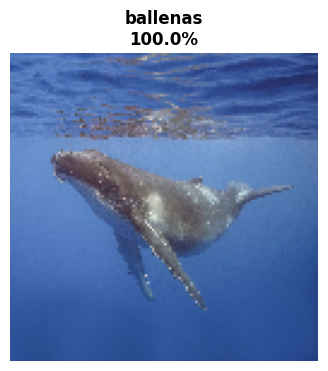

🐾 Resultado: BALLENAS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  : 100.0% █████████████████████████████
   changos   :   0.0% 
   aranas    :   0.0% 

🔍 Procesando imagen 2: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/chango2.png


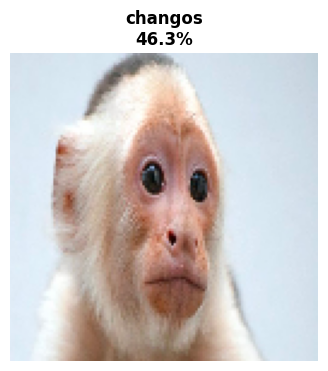

🐾 Resultado: CHANGOS (46.3%)
   Probabilidades:
   ranas     :  31.0% █████████
   pajaros   :   0.4% 
   ballenas  :   0.0% 
   changos   :  46.3% █████████████
   aranas    :  22.3% ██████

🔍 Procesando imagen 3: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/pajaro8.jpg


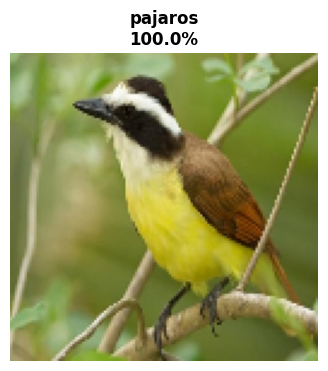

🐾 Resultado: PAJAROS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   : 100.0% █████████████████████████████
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    :   0.0% 

🔍 Procesando imagen 4: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/chango3.jpg


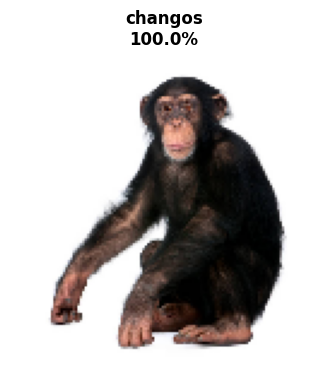

🐾 Resultado: CHANGOS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   : 100.0% ██████████████████████████████
   aranas    :   0.0% 

🔍 Procesando imagen 5: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/ballena3.jpg


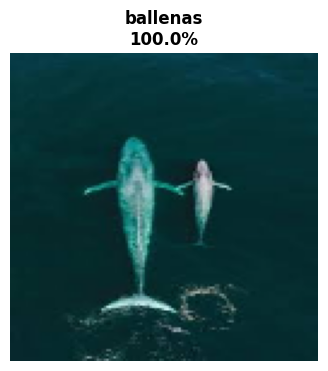

🐾 Resultado: BALLENAS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  : 100.0% █████████████████████████████
   changos   :   0.0% 
   aranas    :   0.0% 

🔍 Procesando imagen 6: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/ballena10.jpg


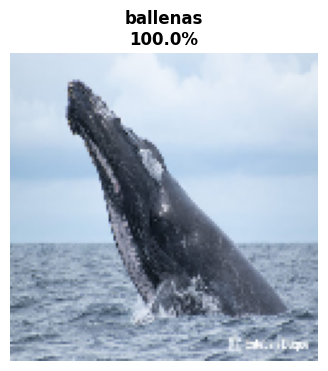

🐾 Resultado: BALLENAS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  : 100.0% █████████████████████████████
   changos   :   0.0% 
   aranas    :   0.0% 

🔍 Procesando imagen 7: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/pajaro2.jpg


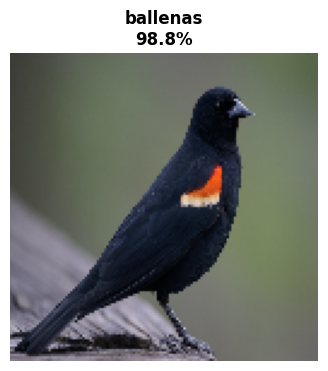

🐾 Resultado: BALLENAS (98.8%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   1.2% 
   ballenas  :  98.8% █████████████████████████████
   changos   :   0.0% 
   aranas    :   0.0% 

🔍 Procesando imagen 8: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/pajaro6.jpg


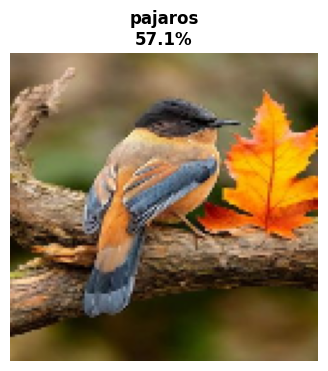

🐾 Resultado: PAJAROS (57.1%)
   Probabilidades:
   ranas     :  12.8% ███
   pajaros   :  57.1% █████████████████
   ballenas  :   0.0% 
   changos   :   0.1% 
   aranas    :  30.0% █████████

🔍 Procesando imagen 9: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/rana9.jpg


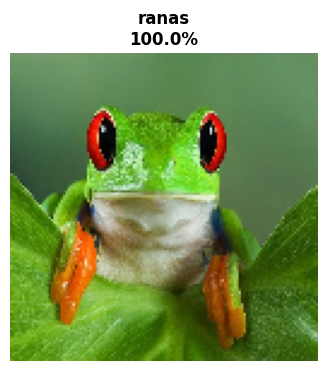

🐾 Resultado: RANAS (100.0%)
   Probabilidades:
   ranas     : 100.0% █████████████████████████████
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    :   0.0% 

🔍 Procesando imagen 10: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/ballena5.jpg


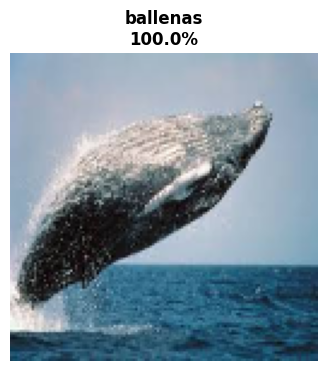

🐾 Resultado: BALLENAS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  : 100.0% █████████████████████████████
   changos   :   0.0% 
   aranas    :   0.0% 

🔍 Procesando imagen 11: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/chango9.jpg


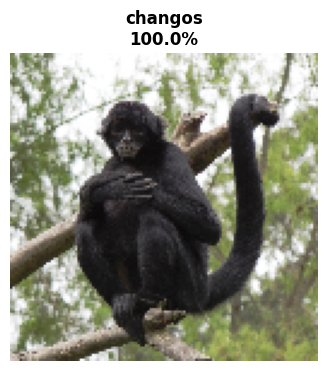

🐾 Resultado: CHANGOS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   : 100.0% █████████████████████████████
   aranas    :   0.0% 

🔍 Procesando imagen 12: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/ballena4.jpg


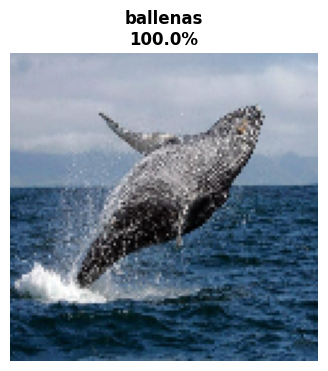

🐾 Resultado: BALLENAS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  : 100.0% ██████████████████████████████
   changos   :   0.0% 
   aranas    :   0.0% 

🔍 Procesando imagen 13: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/ballena11.jpg


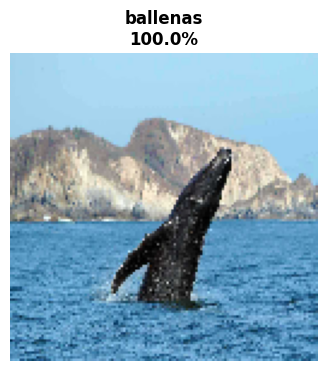

🐾 Resultado: BALLENAS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  : 100.0% █████████████████████████████
   changos   :   0.0% 
   aranas    :   0.0% 

🔍 Procesando imagen 14: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/arana15.png


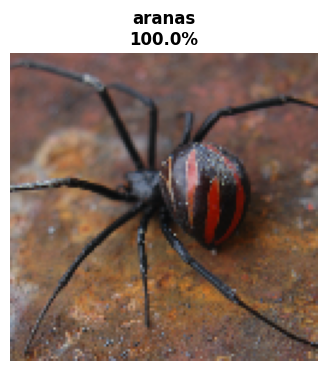

🐾 Resultado: ARANAS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    : 100.0% ██████████████████████████████

🔍 Procesando imagen 15: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/chango14.jpg


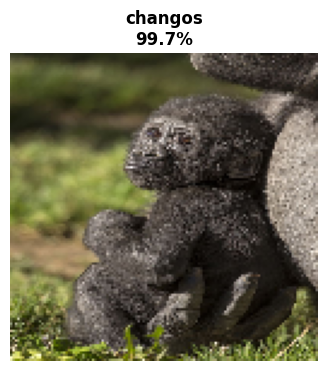

🐾 Resultado: CHANGOS (99.7%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.1% 
   ballenas  :   0.0% 
   changos   :  99.7% █████████████████████████████
   aranas    :   0.2% 

🔍 Procesando imagen 16: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/arana11.jpg


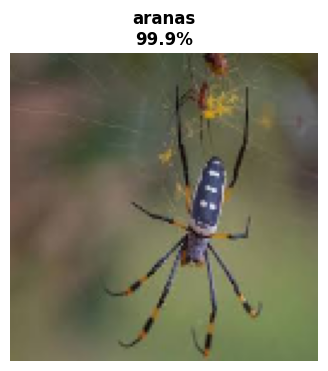

🐾 Resultado: ARANAS (99.9%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.1% 
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    :  99.9% █████████████████████████████

🔍 Procesando imagen 17: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/pajaro11.jpg


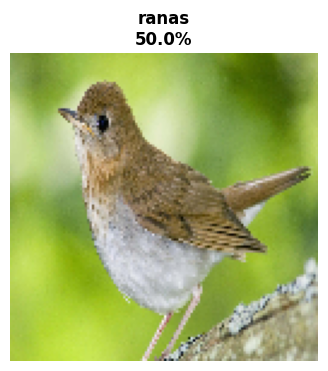

🐾 Resultado: RANAS (50.0%)
   Probabilidades:
   ranas     :  50.0% ███████████████
   pajaros   :  17.4% █████
   ballenas  :   0.0% 
   changos   :   0.1% 
   aranas    :  32.5% █████████

🔍 Procesando imagen 18: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/pajaro9.jpg


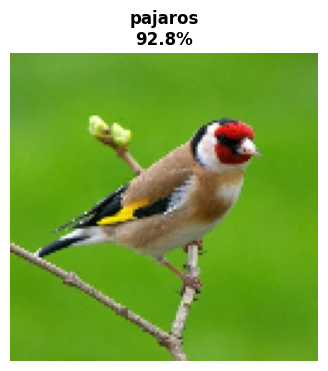

🐾 Resultado: PAJAROS (92.8%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :  92.8% ███████████████████████████
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    :   7.2% ██

🔍 Procesando imagen 19: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/rana5.jpg


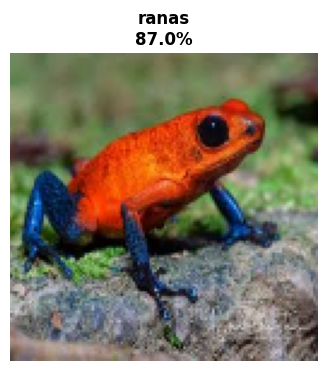

🐾 Resultado: RANAS (87.0%)
   Probabilidades:
   ranas     :  87.0% ██████████████████████████
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   :   0.1% 
   aranas    :  12.9% ███

🔍 Procesando imagen 20: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/chango4.jpg


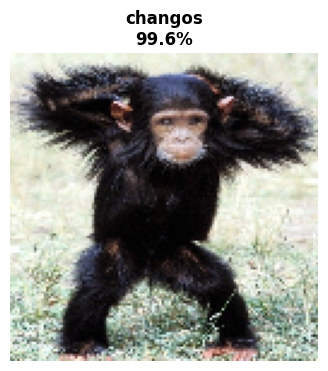

🐾 Resultado: CHANGOS (99.6%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   :  99.6% █████████████████████████████
   aranas    :   0.3% 

🔍 Procesando imagen 21: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/rana11.jpg


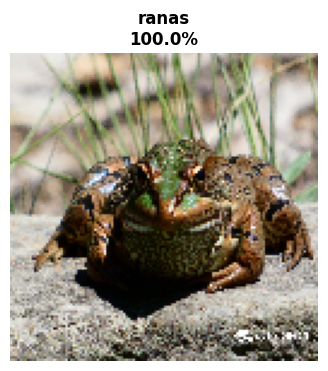

🐾 Resultado: RANAS (100.0%)
   Probabilidades:
   ranas     : 100.0% █████████████████████████████
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    :   0.0% 

🔍 Procesando imagen 22: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/arana13.jpg


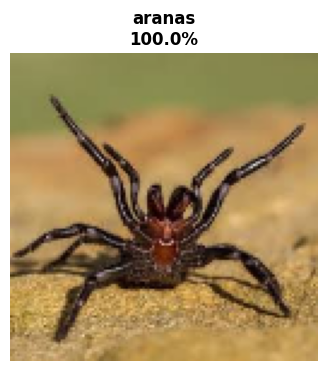

🐾 Resultado: ARANAS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    : 100.0% █████████████████████████████

🔍 Procesando imagen 23: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/ballena6.jpg


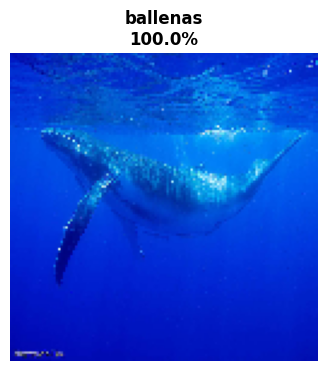

🐾 Resultado: BALLENAS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  : 100.0% ██████████████████████████████
   changos   :   0.0% 
   aranas    :   0.0% 

🔍 Procesando imagen 24: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/rana10.jpg


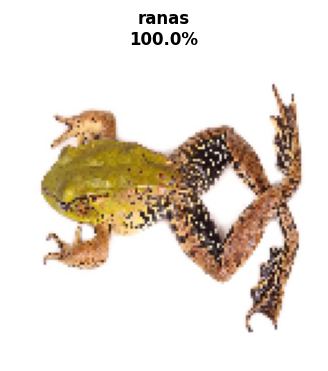

🐾 Resultado: RANAS (100.0%)
   Probabilidades:
   ranas     : 100.0% █████████████████████████████
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    :   0.0% 

🔍 Procesando imagen 25: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/rana.jpg


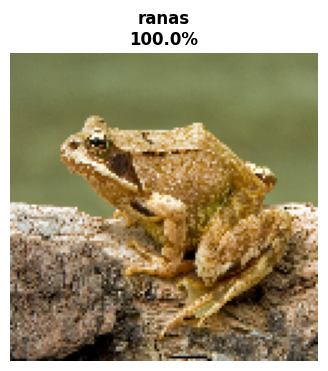

🐾 Resultado: RANAS (100.0%)
   Probabilidades:
   ranas     : 100.0% ██████████████████████████████
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    :   0.0% 

🔍 Procesando imagen 26: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/chango10.jpg


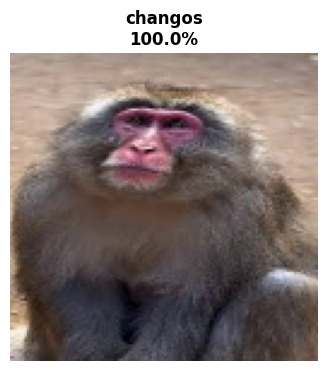

🐾 Resultado: CHANGOS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   : 100.0% ██████████████████████████████
   aranas    :   0.0% 

🔍 Procesando imagen 27: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/rana6.jpg


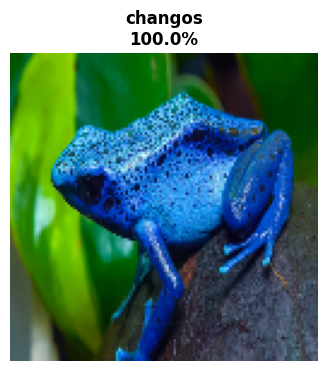

🐾 Resultado: CHANGOS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   : 100.0% █████████████████████████████
   aranas    :   0.0% 

🔍 Procesando imagen 28: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/arana12.jpg


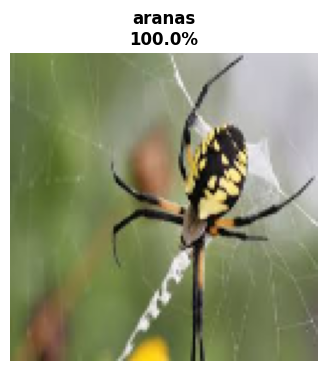

🐾 Resultado: ARANAS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    : 100.0% ██████████████████████████████

🔍 Procesando imagen 29: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/pajaro7.jpg


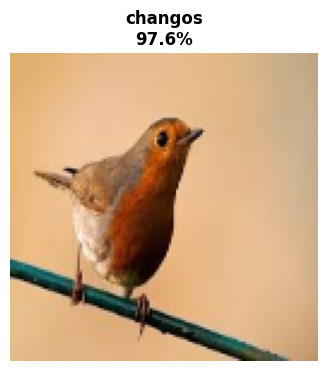

🐾 Resultado: CHANGOS (97.6%)
   Probabilidades:
   ranas     :   0.1% 
   pajaros   :   2.3% 
   ballenas  :   0.0% 
   changos   :  97.6% █████████████████████████████
   aranas    :   0.0% 

🔍 Procesando imagen 30: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/ballena2.jpg


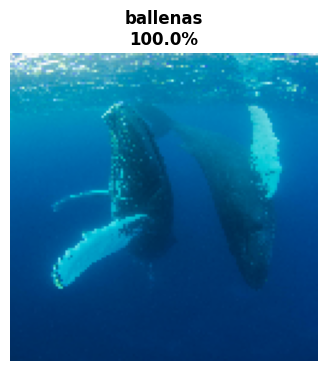

🐾 Resultado: BALLENAS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  : 100.0% ██████████████████████████████
   changos   :   0.0% 
   aranas    :   0.0% 

🔍 Procesando imagen 31: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/rana12.jpg


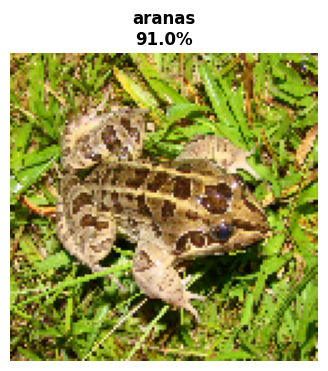

🐾 Resultado: ARANAS (91.0%)
   Probabilidades:
   ranas     :   9.0% ██
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    :  91.0% ███████████████████████████

🔍 Procesando imagen 32: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/arana5.jpg


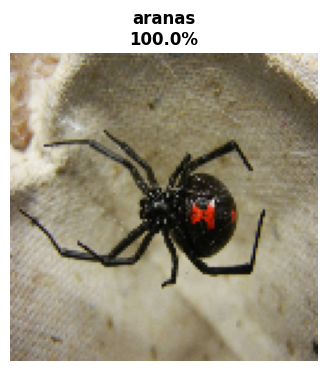

🐾 Resultado: ARANAS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    : 100.0% █████████████████████████████

🔍 Procesando imagen 33: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/chango8.jpg


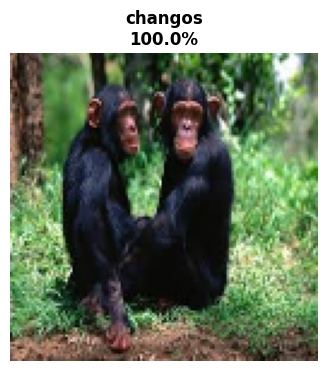

🐾 Resultado: CHANGOS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   : 100.0% ██████████████████████████████
   aranas    :   0.0% 

🔍 Procesando imagen 34: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/arana8.jpg


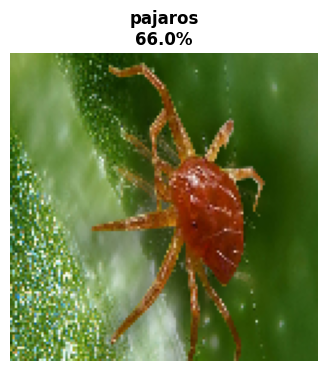

🐾 Resultado: PAJAROS (66.0%)
   Probabilidades:
   ranas     :   0.6% 
   pajaros   :  66.0% ███████████████████
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    :  33.4% ██████████

🔍 Procesando imagen 35: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/pajaro12.jpg


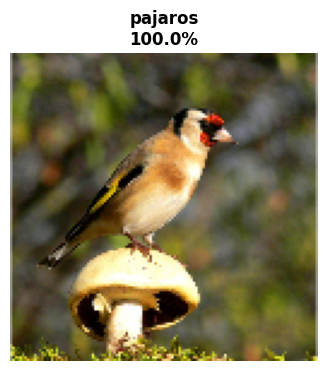

🐾 Resultado: PAJAROS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   : 100.0% █████████████████████████████
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    :   0.0% 

🔍 Procesando imagen 36: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/rana4.jpg


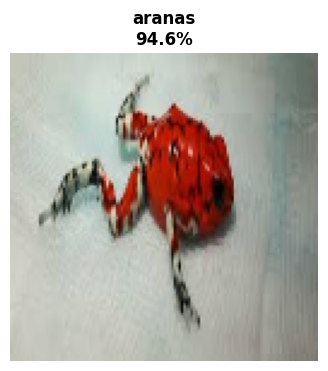

🐾 Resultado: ARANAS (94.6%)
   Probabilidades:
   ranas     :   0.1% 
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   :   5.3% █
   aranas    :  94.6% ████████████████████████████

🔍 Procesando imagen 37: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/arana10.jpg


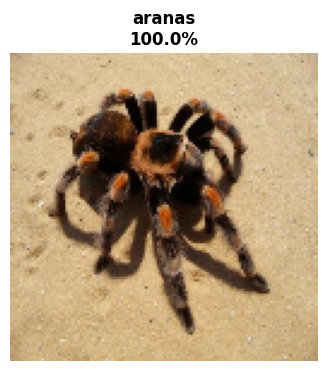

🐾 Resultado: ARANAS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    : 100.0% ██████████████████████████████

🔍 Procesando imagen 38: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/chango7.jpg


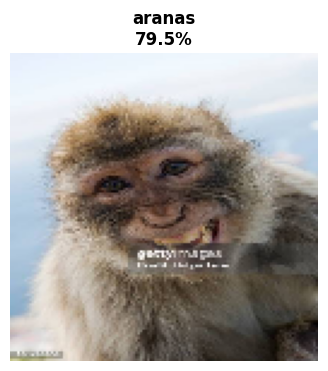

🐾 Resultado: ARANAS (79.5%)
   Probabilidades:
   ranas     :   0.1% 
   pajaros   :   7.7% ██
   ballenas  :   0.0% 
   changos   :  12.6% ███
   aranas    :  79.5% ███████████████████████

🔍 Procesando imagen 39: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/chango11.jpg


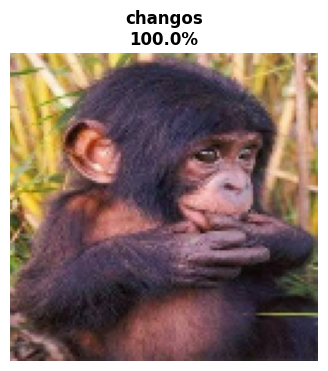

🐾 Resultado: CHANGOS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   : 100.0% █████████████████████████████
   aranas    :   0.0% 

🔍 Procesando imagen 40: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/arana4.jpg


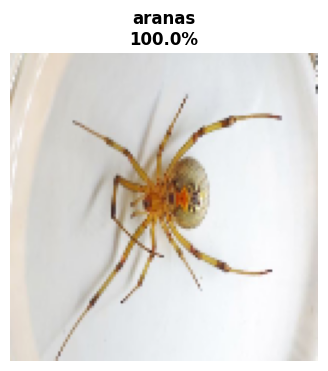

🐾 Resultado: ARANAS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    : 100.0% ██████████████████████████████

🔍 Procesando imagen 41: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/ballena7.jpg


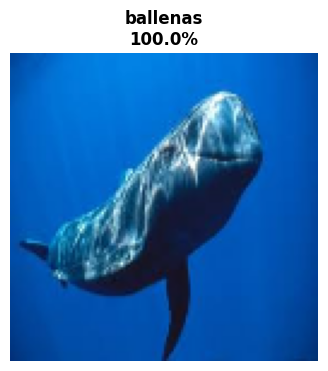

🐾 Resultado: BALLENAS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  : 100.0% ██████████████████████████████
   changos   :   0.0% 
   aranas    :   0.0% 

🔍 Procesando imagen 42: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/arana7.jpg


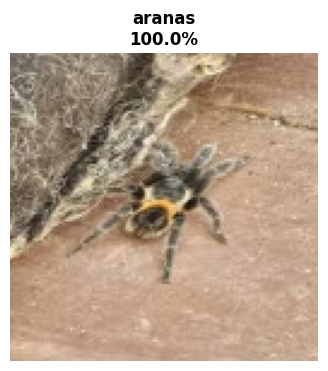

🐾 Resultado: ARANAS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    : 100.0% █████████████████████████████

🔍 Procesando imagen 43: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/rana2.jpg


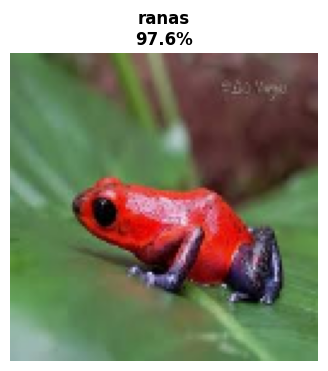

🐾 Resultado: RANAS (97.6%)
   Probabilidades:
   ranas     :  97.6% █████████████████████████████
   pajaros   :   0.1% 
   ballenas  :   0.0% 
   changos   :   0.2% 
   aranas    :   2.1% 

🔍 Procesando imagen 44: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/rana7.jpg


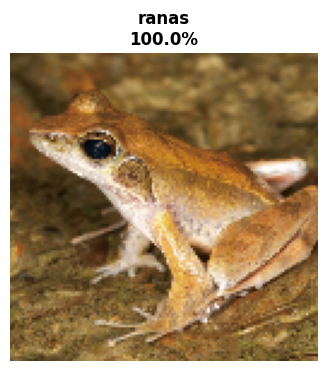

🐾 Resultado: RANAS (100.0%)
   Probabilidades:
   ranas     : 100.0% █████████████████████████████
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    :   0.0% 

🔍 Procesando imagen 45: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/arana14.jpg


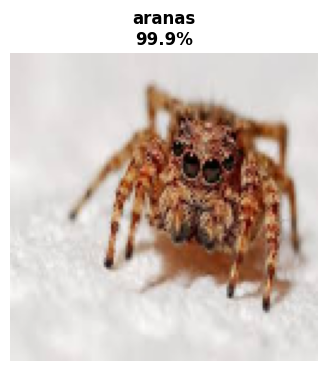

🐾 Resultado: ARANAS (99.9%)
   Probabilidades:
   ranas     :   0.1% 
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    :  99.9% █████████████████████████████

🔍 Procesando imagen 46: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/ballena9.jpg


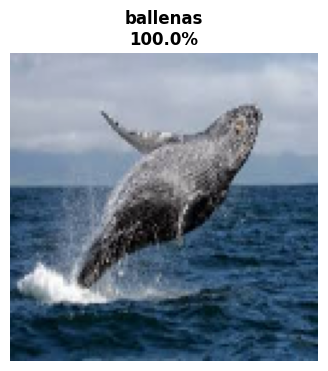

🐾 Resultado: BALLENAS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  : 100.0% ██████████████████████████████
   changos   :   0.0% 
   aranas    :   0.0% 

🔍 Procesando imagen 47: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/arana6.jpg


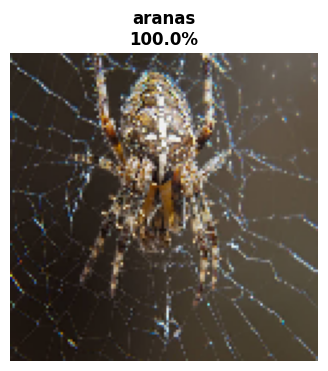

🐾 Resultado: ARANAS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    : 100.0% █████████████████████████████

🔍 Procesando imagen 48: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/rana13.jpg


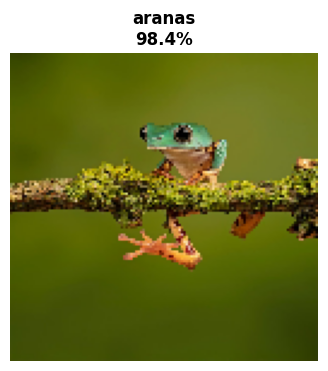

🐾 Resultado: ARANAS (98.4%)
   Probabilidades:
   ranas     :   1.6% 
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    :  98.4% █████████████████████████████

🔍 Procesando imagen 49: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/pajaro10.jpg


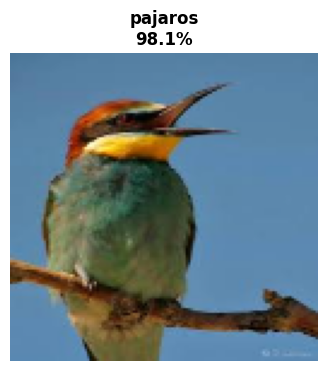

🐾 Resultado: PAJAROS (98.1%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :  98.1% █████████████████████████████
   ballenas  :   1.9% 
   changos   :   0.0% 
   aranas    :   0.0% 

🔍 Procesando imagen 50: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/ballena12.jpg


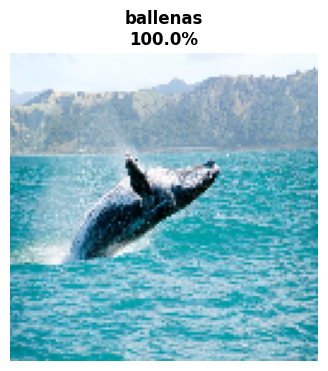

🐾 Resultado: BALLENAS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  : 100.0% ██████████████████████████████
   changos   :   0.0% 
   aranas    :   0.0% 

🔍 Procesando imagen 51: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/Captura de pantalla 2026-04-29 131114.png


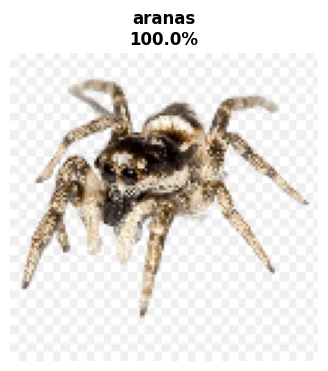

🐾 Resultado: ARANAS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    : 100.0% ██████████████████████████████

🔍 Procesando imagen 52: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/chango12.jpg


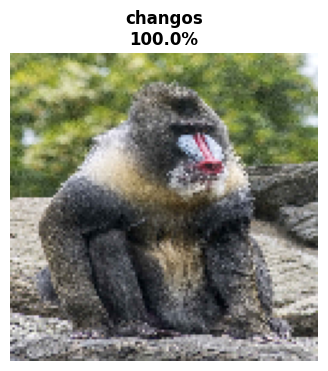

🐾 Resultado: CHANGOS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   : 100.0% █████████████████████████████
   aranas    :   0.0% 

🔍 Procesando imagen 53: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/arana9.jpg


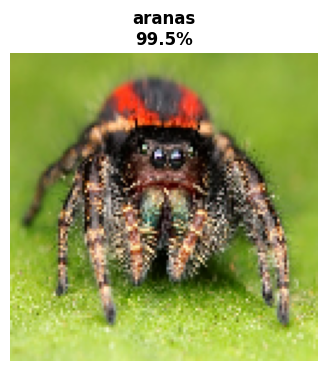

🐾 Resultado: ARANAS (99.5%)
   Probabilidades:
   ranas     :   0.5% 
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    :  99.5% █████████████████████████████

🔍 Procesando imagen 54: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/rana8.jpg


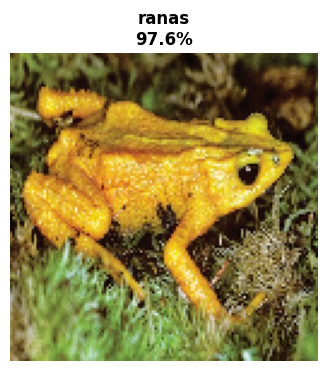

🐾 Resultado: RANAS (97.6%)
   Probabilidades:
   ranas     :  97.6% █████████████████████████████
   pajaros   :   0.2% 
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    :   2.3% 

🔍 Procesando imagen 55: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/arana3.jpg


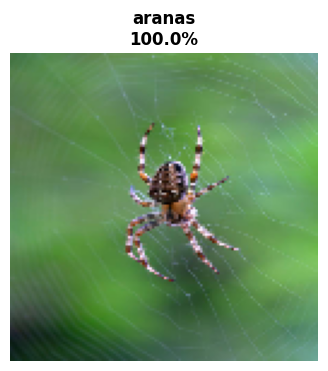

🐾 Resultado: ARANAS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    : 100.0% █████████████████████████████

🔍 Procesando imagen 56: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/Captura de pantalla 2026-05-04 181249.png


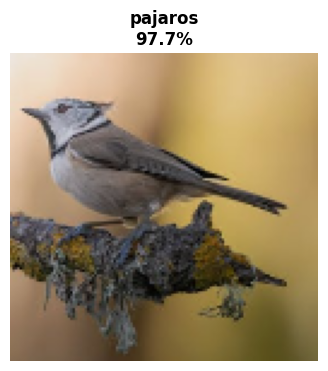

🐾 Resultado: PAJAROS (97.7%)
   Probabilidades:
   ranas     :   1.4% 
   pajaros   :  97.7% █████████████████████████████
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    :   0.9% 

🔍 Procesando imagen 57: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/arana2.jpg


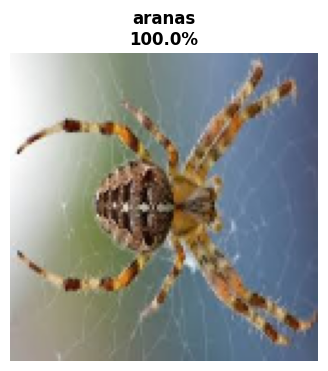

🐾 Resultado: ARANAS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    : 100.0% █████████████████████████████

🔍 Procesando imagen 58: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/rana3.jpg


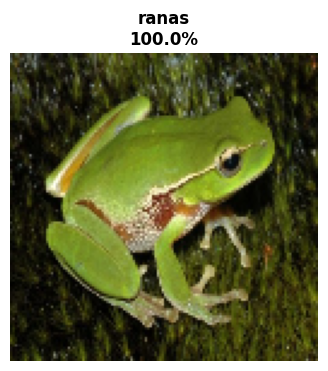

🐾 Resultado: RANAS (100.0%)
   Probabilidades:
   ranas     : 100.0% █████████████████████████████
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    :   0.0% 

🔍 Procesando imagen 59: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/pajaro3.jpg


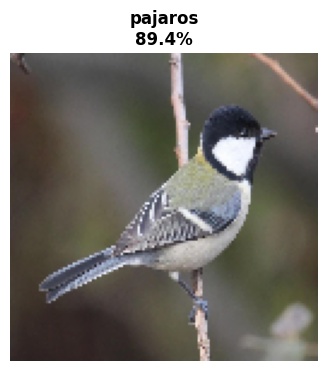

🐾 Resultado: PAJAROS (89.4%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :  89.4% ██████████████████████████
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    :  10.6% ███

🔍 Procesando imagen 60: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/Captura de pantalla 2026-05-07 221352.png


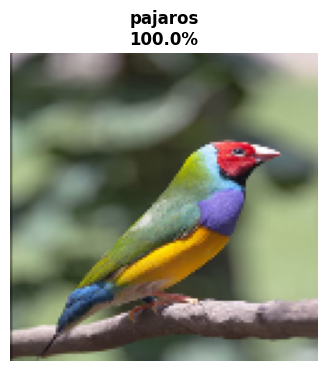

🐾 Resultado: PAJAROS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   : 100.0% █████████████████████████████
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    :   0.0% 

🔍 Procesando imagen 61: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/pajaro5.jpg


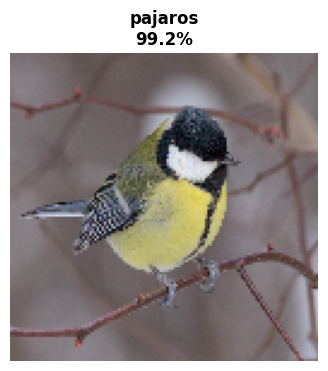

🐾 Resultado: PAJAROS (99.2%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :  99.2% █████████████████████████████
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    :   0.7% 

🔍 Procesando imagen 62: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/chango13.jpg


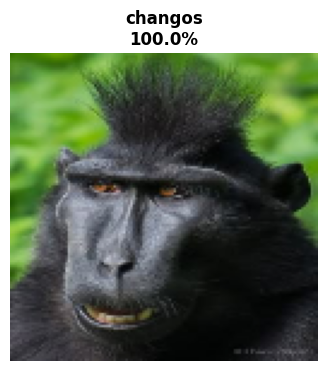

🐾 Resultado: CHANGOS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   : 100.0% █████████████████████████████
   aranas    :   0.0% 

🔍 Procesando imagen 63: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/pajaro1.jpg


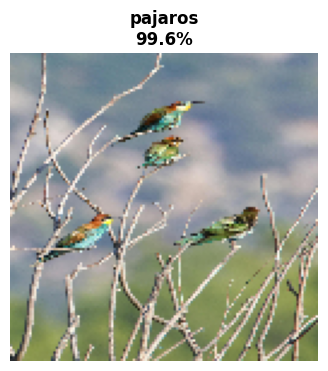

🐾 Resultado: PAJAROS (99.6%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :  99.6% █████████████████████████████
   ballenas  :   0.0% 
   changos   :   0.0% 
   aranas    :   0.3% 

🔍 Procesando imagen 64: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/pajaro4.jpg


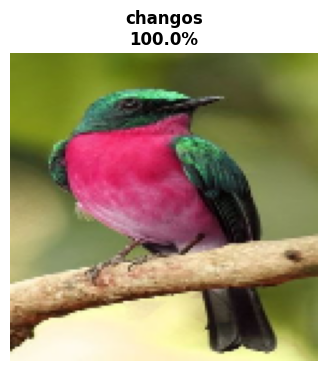

🐾 Resultado: CHANGOS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  :   0.0% 
   changos   : 100.0% █████████████████████████████
   aranas    :   0.0% 

🔍 Procesando imagen 65: /home/glowar23/Descargas/CNN-RGB/animales_prueba/animales_prueba/ballena8.jpg


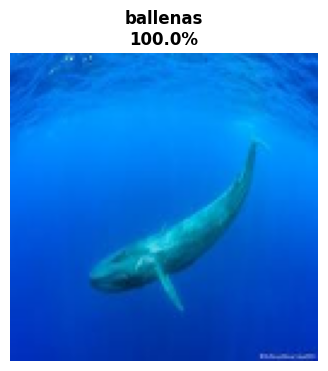

🐾 Resultado: BALLENAS (100.0%)
   Probabilidades:
   ranas     :   0.0% 
   pajaros   :   0.0% 
   ballenas  : 100.0% ██████████████████████████████
   changos   :   0.0% 
   aranas    :   0.0% 


In [ ]:
# =============================================
#   PREDICCIÓN DE IMÁGENES DESDE UNA RUTA ESPECÍFICA
# =============================================
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# 1. Define aquí la ruta de tu carpeta con imágenes
RUTA_DIRECTORIO = "/home/glowar23/Descargas/CNN/pruebas"

# 2. Obtener todas las imágenes válidas del directorio
extensiones_validas = {".jpg", ".jpeg", ".png", ".bmp", ".tiff", ".webp"}
carpeta = Path(RUTA_DIRECTORIO)

# Comprobar si la ruta existe
if not carpeta.exists() or not carpeta.is_dir():
    print(f"❌ La ruta no existe o no es una carpeta: {RUTA_DIRECTORIO}")
    imagenes = []
else:
    # Filtrar solo archivos con las extensiones válidas (ignorando mayúsculas/minúsculas)
    imagenes = [str(archivo) for archivo in carpeta.iterdir() 
                if archivo.is_file() and archivo.suffix.lower() in extensiones_validas]

# Verificar si se encontraron imágenes
if not imagenes:
    print(f"⚠️ No se encontraron imágenes en: {RUTA_DIRECTORIO}")
else:
    print(f"📂 {len(imagenes)} imagen(es) encontrada(s)\n")

    # Recorrer cada imagen
    for i, ruta in enumerate(imagenes):
        print(f"\n🔍 Procesando imagen {i+1}: {ruta}")

        img = cv2.imread(ruta, cv2.IMREAD_COLOR)

        if img is None:
            print("❌ No se pudo leer la imagen.")
            continue

        # Redimensionar
        img_resized = cv2.resize(img, (128, 128))

        # Preparar para el modelo
        img_array = img_resized.astype('float32') / 255.0
        img_array = img_array.reshape(1, 128, 128, 3)

        # Predecir (asumiendo que 'sport_model' y 'clases_nombres' ya están definidos)
        prediccion = sport_model.predict(img_array, verbose=0)
        clase_idx  = np.argmax(prediccion)
        confianza  = prediccion[0][clase_idx] * 100

        # Mostrar imagen
        plt.figure(figsize=(4, 4))
        plt.imshow(cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB))
        plt.title(
            f'{clases_nombres[clase_idx]}\n{confianza:.1f}%',
            fontsize=12,
            fontweight='bold'
        )
        plt.axis('off')
        plt.show()

        # Consola
        print(f'🐾 Resultado: {clases_nombres[clase_idx].upper()} ({confianza:.1f}%)')

        print('   Probabilidades:')
        for clase, prob in zip(clases_nombres, prediccion[0]):
            barra = '█' * int(prob * 30)
            print(f'   {clase:<10}: {prob*100:5.1f}% {barra}')